##### Universidad Politecnica de Madrid. Alumno: Ana Serrano Cifuentes.  2024

# **PROYECTO BIG-DATA : Análisis de condenados** 
### En el siguiente documento se analizarán los condenados en España según la Comunidad Autónoma, teniendo en cuenta su nacionalidad y sexo, desde el año 2019 hasta el 2023.Posteriormente analizaremos la renta anual de cada una de las comunidades y veremos si tienen alguna relación con el número de condenados.

In [95]:
%matplotlib inline
#importamos bibliotecas para manejar datos numéricos y tablas,
#para crear gráficos , visualizar datos  y realizar pruebas estadísticas:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import scipy as scipy
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from libpysal.weights import Queen
from esda.moran import Moran

#importamos las bibliotecas específicas para el análisis geoespacial:
import pysal as ps
import geopandas as gpd
import cartopy
import cartopy.crs as ccrs
import skgstat as skg
import seaborn as sns
import mapclassify

from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
import warnings

#manejo de advertencias (ignoramos  las advertencias Numba Y FutureWarning)
warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=FutureWarning) 

In [96]:
#leemos el csv de nuestros datos (especificando la codificacion del archivo y la separación de las columnas )
datos = pd.read_csv('condenados_final.csv', encoding='latin-1', sep=";")

# Visualizamos las  20 primeras filas del csv
datos.head(20)


,Comunidades y ciudades autónomas,Sexo,Nacionalidad,Periodo,Total
0,01 Andalucía,Total,Total,2019,54848
1,01 Andalucía,Total,Española,2019,46444
2,01 Andalucía,Total,Extranjera,2019,8404
3,01 Andalucía,Hombres,Total,2019,43624
4,01 Andalucía,Hombres,Española,2019,36775
5,01 Andalucía,Hombres,Extranjera,2019,6849
6,01 Andalucía,Mujeres,Total,2019,11224
7,01 Andalucía,Mujeres,Española,2019,9669
8,01 Andalucía,Mujeres,Extranjera,2019,1555
9,02 Aragón,Total,Total,2019,6742


In [97]:
# tamaño del dataset (nºfilas, nºcolumnas)
datos.shape

(855, 5)

In [98]:
# Resumen detallado del dataframe 
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 855 entries, 0 to 854
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   Comunidades y ciudades autónomas  855 non-null    object
 1   Sexo                              855 non-null    object
 2   Nacionalidad                      855 non-null    object
 3   Periodo                           855 non-null    int64 
 4   Total                             855 non-null    int64 
dtypes: int64(2), object(3)
memory usage: 33.5+ KB


In [99]:
#Verificamos que no haya valores nulos. 
datos.isnull().sum()

Comunidades y ciudades autónomas    0
Sexo                                0
Nacionalidad                        0
Periodo                             0
Total                               0
dtype: int64

# Análisis  de los datos
<span style="color:red">He exportado las gráficas a parte como html.Al exportar el archivo completo no se veía ninguna</span>
### Exploración de los datos para responder a preguntas clave

## ¿Cuál es el total de condenados según su nacionalidad?

#### Gráficas obtenidas de la documetación de plotly y la página mappinggis:
#### https://plotly.com/python/renderers/ 
#### https://mappinggis.com/2024/09/plotly-crea-graficos-interactivos-con-datos-espaciales/
#### (corrección de errores chatgpt)

    Comunidades y ciudades autónomas   Sexo Nacionalidad  Periodo  Total
1                       01 Andalucía  Total     Española     2019  46444
2                       01 Andalucía  Total   Extranjera     2019   8404
10                         02 Aragón  Total     Española     2019   4790
11                         02 Aragón  Total   Extranjera     2019   1952
19        03 Asturias, Principado de  Total     Española     2019   5590
..                               ...    ...          ...      ...    ...
830                     17 Rioja, La  Total   Extranjera     2023    478
838                         18 Ceuta  Total     Española     2023    689
839                         18 Ceuta  Total   Extranjera     2023    219
847                       19 Melilla  Total     Española     2023    572
848                       19 Melilla  Total   Extranjera     2023    207

[190 rows x 5 columns]
  Nacionalidad    Total
0     Española  1026371
1   Extranjera   353153


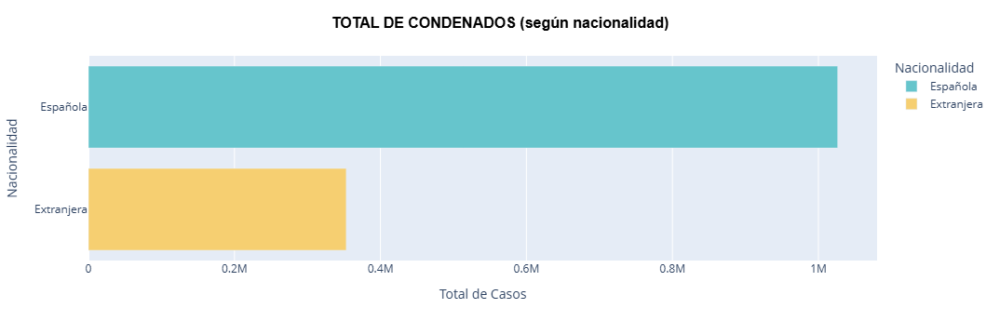

In [101]:
#Para reponder a esta pregunta necesitamos filtrar los datos, queremos distinguir entre la nacionalidad española y extranjera .
#Sin tener en cuenta el sexo en este caso (para ello lo igualamos al total) tenemos que sumar el total de cada comunidad autonoma todos los años .

datos_filtrados = datos[datos['Nacionalidad'].isin(['Española', 'Extranjera']) & (datos['Sexo'] == 'Total')]
print(datos_filtrados)

datos_agrupados_nacionalidad = datos_filtrados.groupby('Nacionalidad')['Total'].sum().reset_index()
print(datos_agrupados_nacionalidad)

# Usamos la libreria de gráficas Plotly.Primero creamos el gráfico
grafico = px.bar(
    data_frame=datos_agrupados_nacionalidad,
    x='Total',
    y='Nacionalidad',
    orientation='h', 
    color='Nacionalidad',  
    color_discrete_sequence=px.colors.qualitative.Pastel,  
      
)

# Cambiamos las etiquetas y el diseño 
grafico.update_layout(
    title=dict(   # usaré este fragmento para diseñar los títulos de todas las gráficas 
        text="TOTAL DE CONDENADOS (según nacionalidad)",  
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # ponemos el titulo en el centro 
    ),
    xaxis_title="Total de Casos",
    yaxis_title="Nacionalidad",
    title_font_size=16,
    xaxis=dict(title_font_size=14),
    yaxis=dict(title_font_size=14)
)

grafico.write_html("grafica1.html")

grafico.show()


#### En la gráfica superior observamos que la población española presenta un número total de condenados  notablemente superior en comparación con otras nacionalidades.Es algo esperable puesto que son datos de España y esta población contituye la mayor parte.La poblacion española tiene un total de 1.026.371 condenados en los cinco años estudiados mientras que la extranjera tiene 353.153.

## ¿Cuál es el total de condenados según las comunidades y ciudades autónomas?

#### Al igual que el anterior, extraído de la documentación de plotly ,(ajustando errores con chat gpt).
#### https://plotly.com/python/reference/layout/   

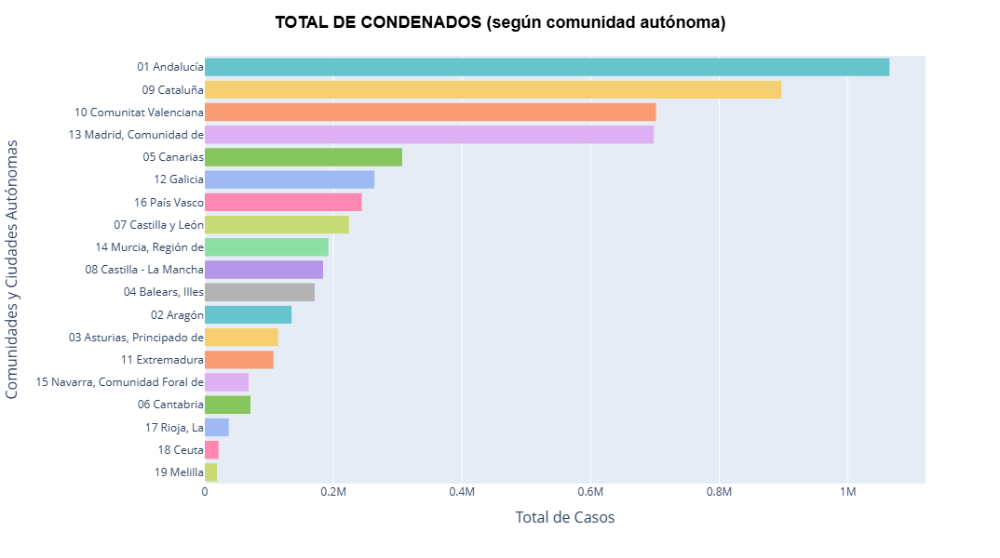

In [103]:

#ordenamos los valores para que la gráfica los muestre en orden descendente segun el total.
datos = datos.sort_values(by='Total', ascending=False)

# Usamos la libreria de gráficas Plotly
grafico = px.histogram(
    data_frame=datos,
    x='Total',
    y='Comunidades y ciudades autónomas',
    orientation='h', 
    color='Comunidades y ciudades autónomas', 
    color_discrete_sequence=px.colors.qualitative.Pastel   
)

# Cambiamos las etiqueytas y el diseño
grafico.update_layout(
    title=dict(
        text="TOTAL DE CONDENADOS (según comunidad autónoma)",  
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5 # ponemos el título en el centro       
    ),
    xaxis_title="Total de Casos",
    yaxis_title="Comunidades y Ciudades Autónomas",
    xaxis=dict(title_font=dict(size=16)),
    yaxis=dict(title_font=dict(size=16)),
    showlegend=False ,
    width=1000,  
    height=600 
)
grafico.write_html("grafica2.html")
grafico.show()


## ¿En que año hay un mayor número de condenados en general?

#### Creado con  la documetación de plotly ,usando chatgpt para mejorar la representación .
#### https://plotly.com/python/reference/layout/   


    Comunidades y ciudades autónomas   Sexo Nacionalidad  Periodo  Total
513                     01 Andalucía  Total        Total     2022  59859
342                     01 Andalucía  Total        Total     2021  55397
0                       01 Andalucía  Total        Total     2019  54848
684                     01 Andalucía  Total        Total     2023  53568
585                      09 Cataluña  Total        Total     2022  50562
..                               ...    ...          ...      ...    ...
333                       19 Melilla  Total        Total     2020    890
675                       19 Melilla  Total        Total     2022    870
666                         18 Ceuta  Total        Total     2022    866
846                       19 Melilla  Total        Total     2023    779
504                       19 Melilla  Total        Total     2021    740

[95 rows x 5 columns]
   Periodo   Total
0     2019  286931
1     2020  221437
2     2021  282210
3     2022  308624
4     

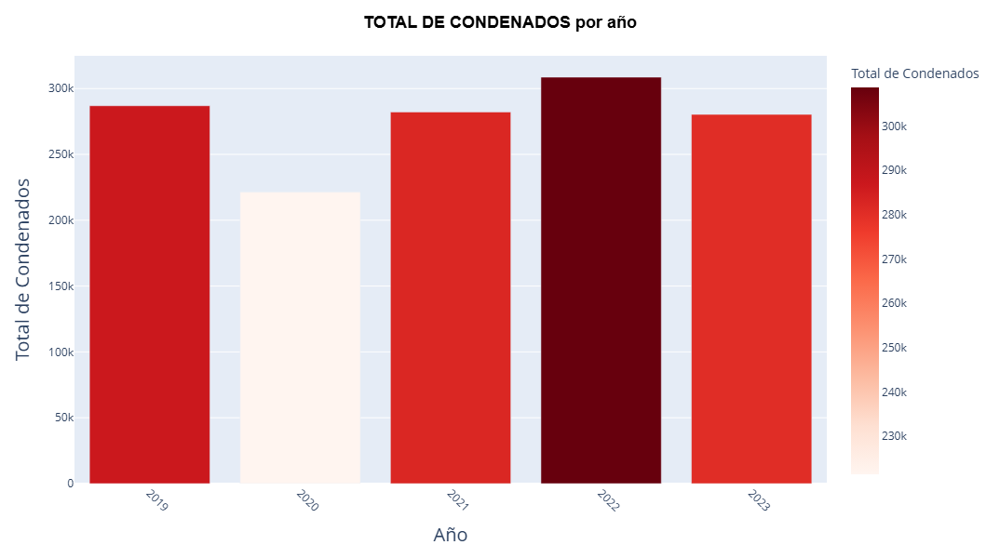

In [104]:
#filtramos por el total de nacionalidad y sexo 
datos_tot = datos[datos['Nacionalidad'].isin(['Total']) & (datos['Sexo'] == 'Total')]
print(datos_tot)

# Agrupamos cada año y sumamos el total
datos_agrupados_años = datos_tot.groupby('Periodo')['Total'].sum().reset_index()
print(datos_agrupados_años)


# Usamos la libreria de gráficas Plotly para crear el gráfico 
grafico = px.bar(
    data_frame=datos_agrupados_años,
    x='Periodo',  
    y='Total',  
    color='Total',  
    labels={'Periodo': 'Año', 'Total': 'Total de Condenados'}  ,
    color_continuous_scale='reds'   
    
)

# Cambiamos las etiquetas y el diseño
grafico.update_layout(
    title=dict(
        text="TOTAL DE CONDENADOS por año",  
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
     
    xaxis_title="Año",
    yaxis_title="Total de Condenados",
    xaxis=dict(
        title_font=dict(size=20),
        tickangle=45,  # Rotamos etiquetas de los años  
        tickvals=datos_agrupados_años['Periodo'],  
        
    ),
    yaxis=dict(title_font=dict(size=20)),
    width=1000,  
    height=600,  
)
grafico.write_html("grafica3.html")
grafico.show()




#### En la gráfica de condenados por año se puede observar que, en términos generales, el total de condenados se mantiene bastante estable a lo largo del tiempo. Sin embargo, los años 2020 y 2022 presentan variaciones destacables. La pandemia de COVID-19 puede ser una de las principales causas de la disminución de condenados en 2020 debido a las numerosas restricciones que se impusieron. La vuelta a la normalidad en el año 2022 podría explicar este aumento en el total de condenados en este año.


## Porcentaje del total de condenados
#### Creado con la documentación de plotly para gráficos de tartas : https://plotly.com/python/pie-charts/

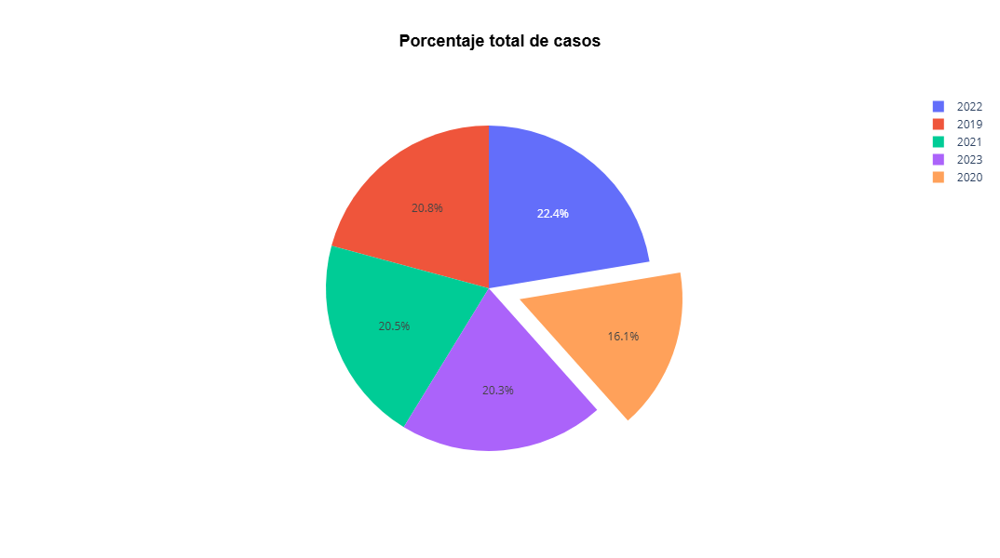

In [105]:

# años que queremos mostrar
X = datos[datos['Periodo'] == 2019]['Total'].sum()
X_1 = datos[datos['Periodo'] == 2020]['Total'].sum()
X_2 = datos[datos['Periodo'] == 2021]['Total'].sum()
X_3 = datos[datos['Periodo'] == 2022]['Total'].sum()
X_4 = datos[datos['Periodo'] == 2023]['Total'].sum()

# Creamos DataFrame con los valores y las etiquetas
df_años = pd.DataFrame({
    'Año': [2019, 2020, 2021, 2022, 2023],
    'Total': [X, X_1, X_2, X_3, X_4]
})


# Extraer los valores y etiquetas
labels = df_años['Año']
values = df_años['Total']

# como el 2020 es el año con mas cambios lo destacamos con la opción pull
pull_values = [0, 0.2, 0, 0, 0]  #en la segunda posición

# Crear el gráfico de tarta con Plotly
fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=pull_values)])

# Personalizar el gráfico
fig.update_layout(
    title=dict(  #fragmento que usaré en todas las gráficas para mejorar la visualización del título
        text='Porcentaje total de casos',  
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
   
    width=800,  # ancho 
    height=600,  # altura 
)
grafico.write_html("grafica4.html")
fig.show()




#### Otra manera de ver el total de los condenados por año, esta vez, en forma de porcentaje, donde se puede apreciar la notable diferencia en el año 2020, presentando un 16,1 % de los casos totales. De esta manera también podemos observar como el porcentaje de los años 2019,2021,2023 oscila entre el 20.3 % y el 20.8%, mientras que el del año 2022 es superior (22.4%) .

##  Porcentaje de casos totales según la comunidad autónoma por año 

#### Creado con la documentación de plotly para gráficos de tartas : https://plotly.com/python/pie-charts/
#### Ajuste de errores con chatgpt

   Comunidades y ciudades autónomas  Periodo   Total
0                      01 Andalucía     2019  219392
1                      01 Andalucía     2020  169856
2                      01 Andalucía     2021  221588
3                      01 Andalucía     2022  239436
4                      01 Andalucía     2023  214272
..                              ...      ...     ...
90                       19 Melilla     2019    5932
91                       19 Melilla     2020    3560
92                       19 Melilla     2021    2960
93                       19 Melilla     2022    3480
94                       19 Melilla     2023    3116

[95 rows x 3 columns]


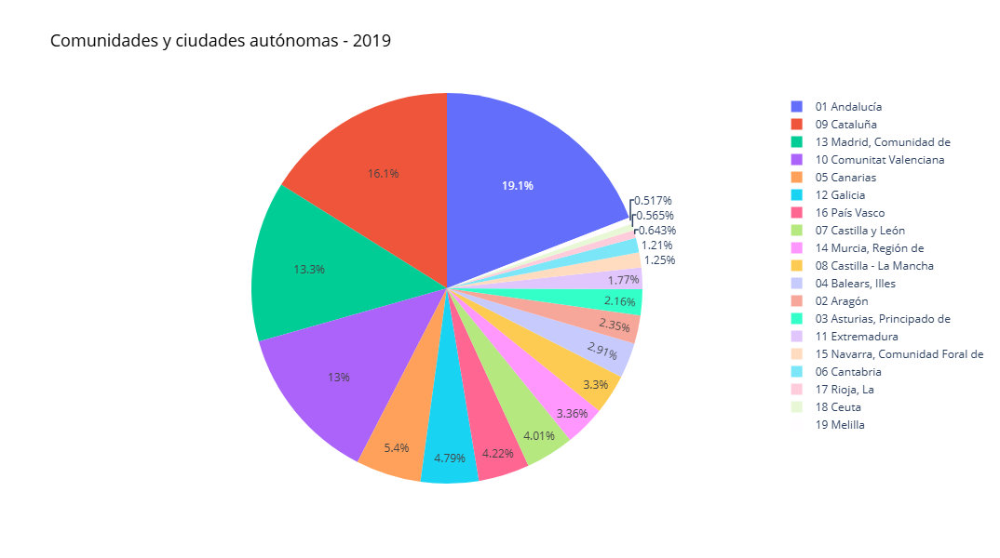

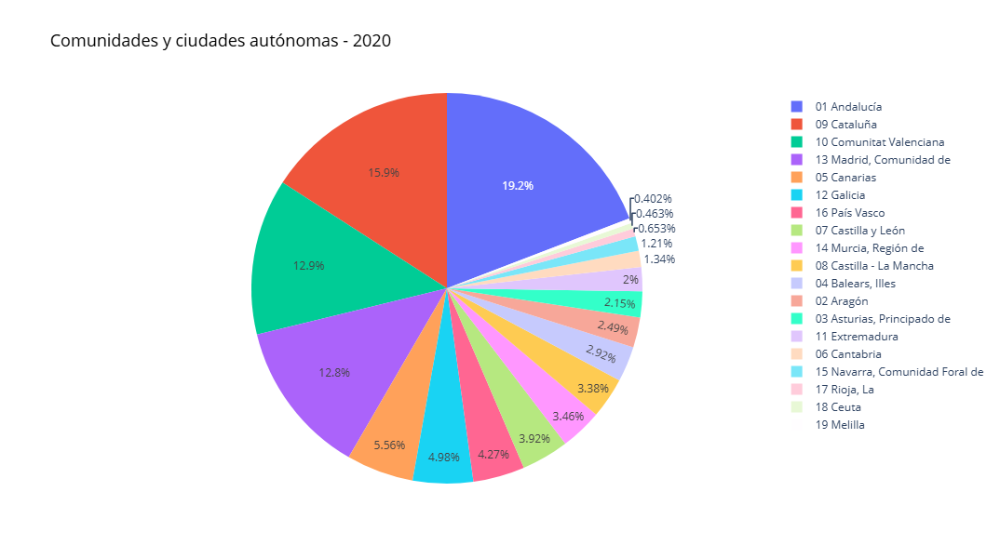

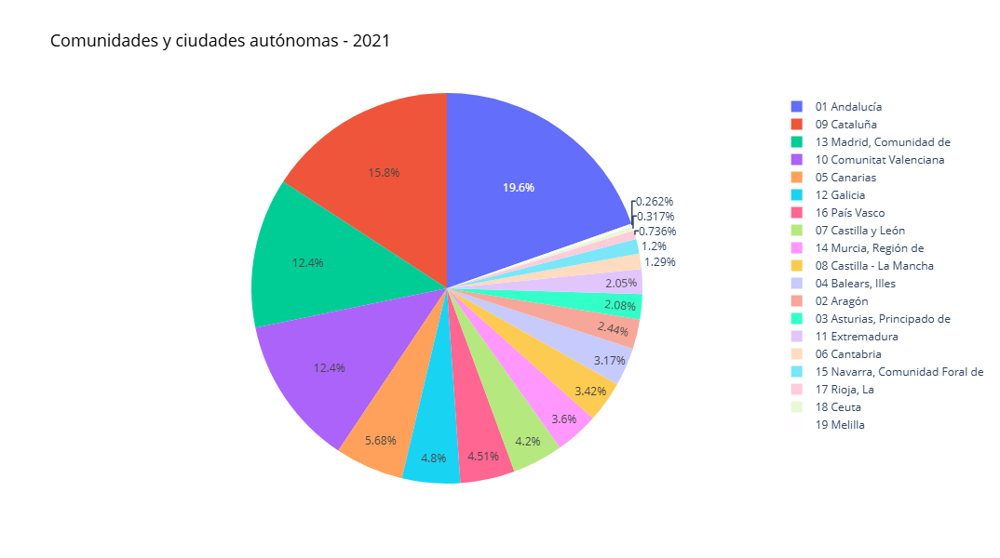

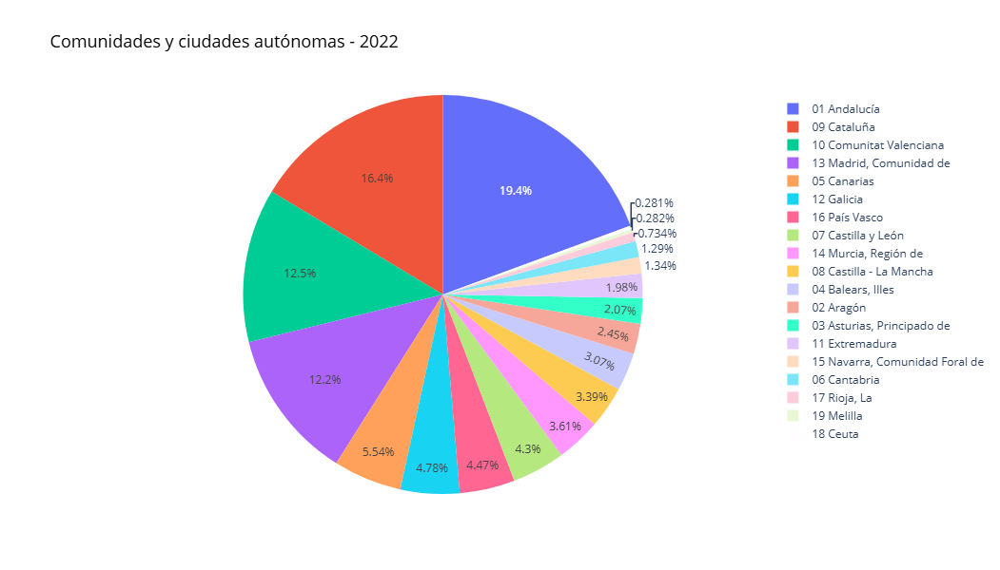

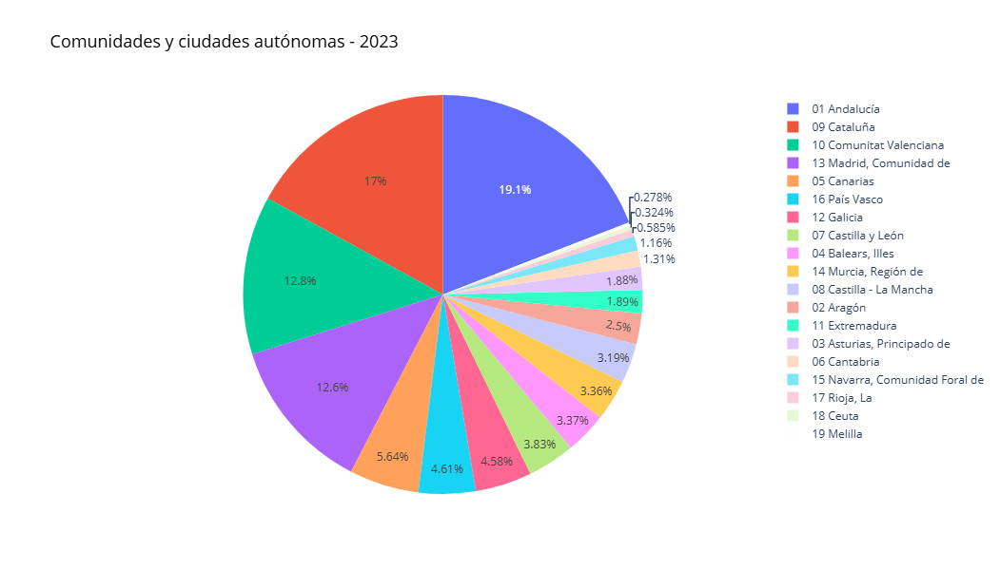

In [107]:
grupo = pd.DataFrame(datos.groupby(['Comunidades y ciudades autónomas', 'Periodo'])['Total'].sum()).reset_index()
print(grupo)

#ordenamos el total de casos ascendentemente
grupo = grupo.sort_values(['Periodo', 'Total'], ascending=[True, False])

# creamos un gráfico por cada uno de los años 
for año in grupo['Periodo'].unique():
    años_dato = grupo[grupo['Periodo'] == año]  
    
    labels = años_dato['Comunidades y ciudades autónomas']
    values = años_dato['Total']
    
    fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
    fig.update_layout(
        title_text=f'Comunidades y ciudades autónomas - {año}', 
        title_font=dict(size=18, color="black"),
        width=800,
        height=600
    )
    grafico.write_html("grafica5.html")
    fig.show()

#### En la siguiente representación de gráficos de tartas, podemos comparar el total de condenados (en porcentaje) de cada una de las comunidades  a lo largo de los cinco años estudiados. Observamos que en generl no hay grandes variaciones entre los casos de cada una de los comunidades en estos años. Andalucía es la comunidad con más casos totales y presenta un 19.1 % de los casos en el 2019, aumentando ligeramente en el 2020 a un 19.2%. Siendo una de las comunidades junto con Canarias, Galicia y Pais Vasco que aumentan el número de casos en el año a pesar de la pandemia.


## ¿Qué sexo presenta el mayor total de condenados?

#### Creado con la documentación de plotly : https://plotly.com/python/bar-charts/

      Sexo    Total
0  Hombres  1109575
1  Mujeres   269949


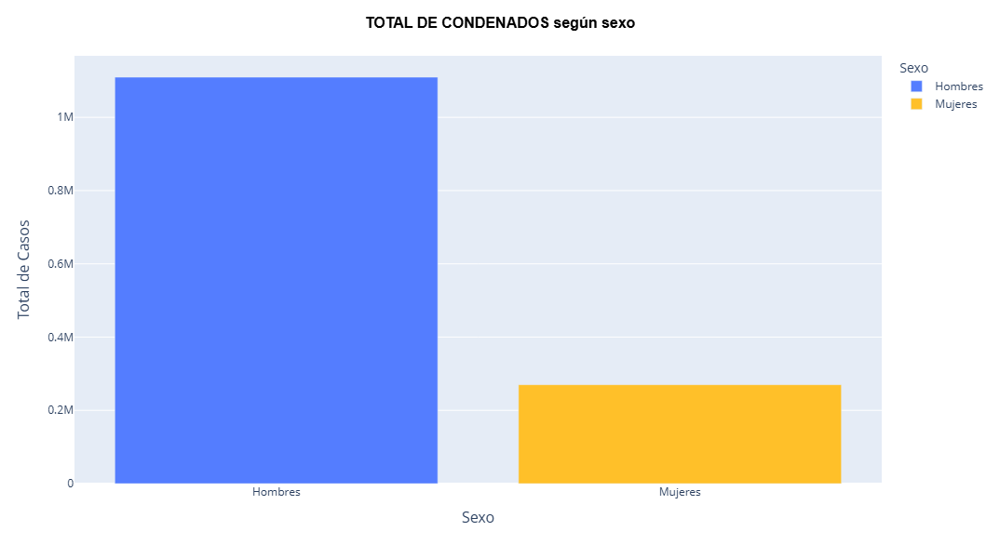

In [108]:

datos_filtrados_sexo = datos[(datos['Nacionalidad'] == 'Total') & (datos['Sexo'].isin(['Hombres', 'Mujeres']))]

datos_agrupados_sexo = datos_filtrados_sexo.groupby('Sexo', as_index=False)['Total'].sum()
print(datos_agrupados_sexo)

# Usamos la libreria de gráficas Plotly para crear el gráfico 
fig = px.bar(
    datos_agrupados_sexo, 
    x='Sexo',  
    y='Total',  
    color='Sexo',  
    color_discrete_map={'Hombres': '#547dff', 'Mujeres': '#ffc029'},  
    labels={'Sexo': 'Sexo', 'Total': 'Total de Casos'}  
)

# Cambiamos diseño
fig.update_layout(
     title=dict(
        text="TOTAL DE CONDENADOS según sexo",  
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
    title_font=dict(size=16),  
    xaxis_title='Sexo',  
    yaxis_title='Total de Casos',  
    xaxis=dict(title_font=dict(size=16)),  
    yaxis=dict(title_font=dict(size=16)),  
    width=800, 
    height=600,  
)
grafico.write_html("grafica6.html")
fig.show()


#### En este gráfico observamos la notable diferencia entre los condenados mujeres y hombres, presentando estos últimos un total considerablemente superior. En la tabla superior tenemos el total de condenados hombres:1.109.575 y mujeres:269.949

## Comunidades con mayor suma de condenados y años 

#### Creado con la documentación de plotly: https://plotly.com/python/renderers/
#### Corrección de errores con chatgpt

   Comunidades y ciudades autónomas  Periodo   Total
0                      01 Andalucía     2019  219392
1                      01 Andalucía     2020  169856
2                      01 Andalucía     2021  221588
3                      01 Andalucía     2022  239436
4                      01 Andalucía     2023  214272
..                              ...      ...     ...
90                       19 Melilla     2019    5932
91                       19 Melilla     2020    3560
92                       19 Melilla     2021    2960
93                       19 Melilla     2022    3480
94                       19 Melilla     2023    3116

[95 rows x 3 columns]


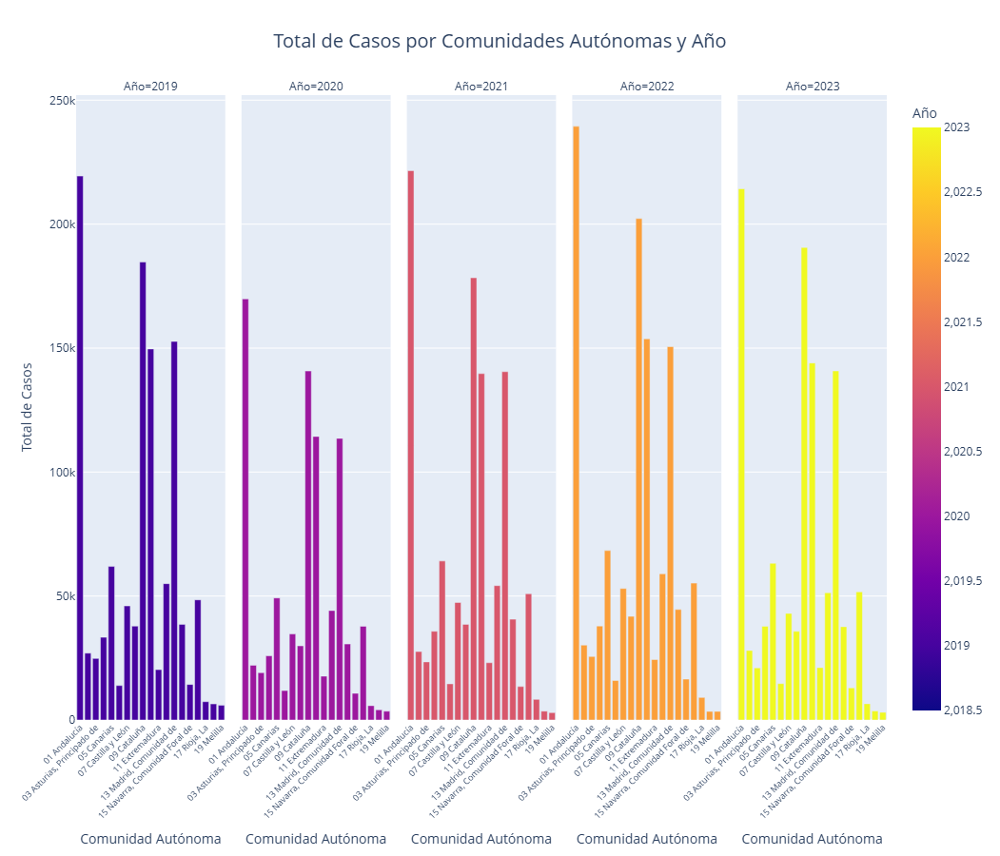

In [109]:
datos_agrupados = datos.groupby(['Comunidades y ciudades autónomas', 'Periodo'])['Total'].sum().reset_index()
print(datos_agrupados)

# Crear gráfico de barras con barras separadas para cada año usando facetas
fig = px.bar(datos_agrupados, 
             x='Comunidades y ciudades autónomas', 
             y='Total', 
             color='Periodo',  
             title='Total de Casos por Comunidades Autónomas y Año',
             labels={'Comunidades y ciudades autónomas': 'Comunidad Autónoma', 'Total': 'Total de Casos', 'Periodo': 'Año'},
             facet_col='Periodo',  
             barmode='group')  # Esto agrupa las barras de cada año por Comunidad Autónoma

# Personalización del gráfico
fig.update_layout(
    xaxis_title='Comunidad Autónoma',
    yaxis_title='Total de Casos',
    width=1200,  # Ancho
    height=900,  # Alto 
    bargap=0.2,  # Espacio entre las barras
    title=dict(
        x=0.5,  # Centrar el título
        font=dict(size=20)
    ),
    legend_title='Año'  # Título de la leyenda
)

fig.update_xaxes(
    tickangle=-45,               
    tickfont=dict(size=9)      
)

grafico.write_html("grafica7.html")
fig.show()

#### De esta manera podemos comparar los condenados entre cada  comunidad , así como ver cómo han variado en los cinco años propuestos. En estos cinco años, Andalucia, Cataluña, Madrid y Comunidad Valenciana presentan un volumen superior respecto a las demás comunidades, son de las más pobladas de España lo que puede explicar estas cifras .También podemos observar el incremtno general de condenados en 2021 y 2022 con resepcto al 2020. En el año 2023 parece que los valores se estabilizan mostrando una menor variabilidad en comparación con años anteriores a la pandemia.

## ¿Hay alguna comunidad autónoma donde la cantidad de condenados extranjeros supere a la de los nacionales?

#### Creado con la documentación de plotly: https://plotly.com/python/renderers/
#### Corrección de errores con chatgpt

   Comunidades y ciudades autónomas Nacionalidad   Total
0                      01 Andalucía     Española  222542
1                      01 Andalucía   Extranjera   43594
2                         02 Aragón     Española   23122
3                         02 Aragón   Extranjera   10600
4        03 Asturias, Principado de     Española   25443
5        03 Asturias, Principado de   Extranjera    3045
6                 04 Balears, Illes     Española   27775
7                 04 Balears, Illes   Extranjera   14914
8                       05 Canarias     Española   61683
9                       05 Canarias   Extranjera   15024
10                     06 Cantabria     Española   15022
11                     06 Cantabria   Extranjera    2711
12               07 Castilla y León     Española   47200
13               07 Castilla y León   Extranjera    8836
14          08 Castilla - La Mancha     Española   36669
15          08 Castilla - La Mancha   Extranjera    9307
16                      09 Cata

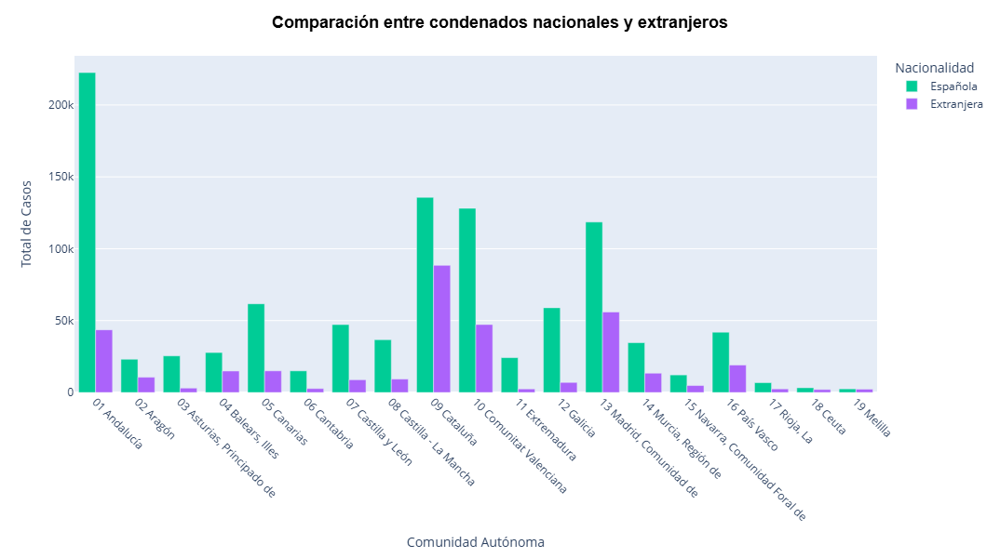

In [110]:

# Agrupamos los datos por comunidad autónoma y nacionalidad
datos_agrupados_nac = datos_filtrados.groupby(['Comunidades y ciudades autónomas', 'Nacionalidad'])['Total'].sum().reset_index()
print(datos_agrupados_nac)

# Crear el gráfico de barras agrupado
fig = px.bar(
    datos_agrupados_nac,
    x='Comunidades y ciudades autónomas',
    y='Total',
    color='Nacionalidad',
    color_discrete_map={
        'Españoles': 'green', 
        'Extranjeros': 'yellow'
 },
    
    labels={
        'Comunidades y ciudades autónomas': 'Comunidad Autónoma',
        'Total': 'Total de Casos',
        'Nacionalidad': 'Nacionalidad'
    },
    barmode='group'  
)

# cambiamos diseño de grafica
fig.update_layout(
    title=dict(
        text='Comparación entre condenados nacionales y extranjeros',
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
    xaxis_title='Comunidad Autónoma',
    yaxis_title='Total de Casos',
    xaxis_tickangle=45,  
    width=1000,  # Ancho 
    height=600,  # Alto 
    bargap=0.2,  # Espacio entre barras
    
)
grafico.write_html("grafica8.html")
fig.show()


#### Observando la  gráfica superior observamos que en ninguna de las comunidades autónomas el número de condenados extranjeros supera al nímero de condenados españoles. Observamos las menores difencias en  Melilla con un valor de 222.

## Comparativa de condenados en los diferentes años, diferenciando el sexo

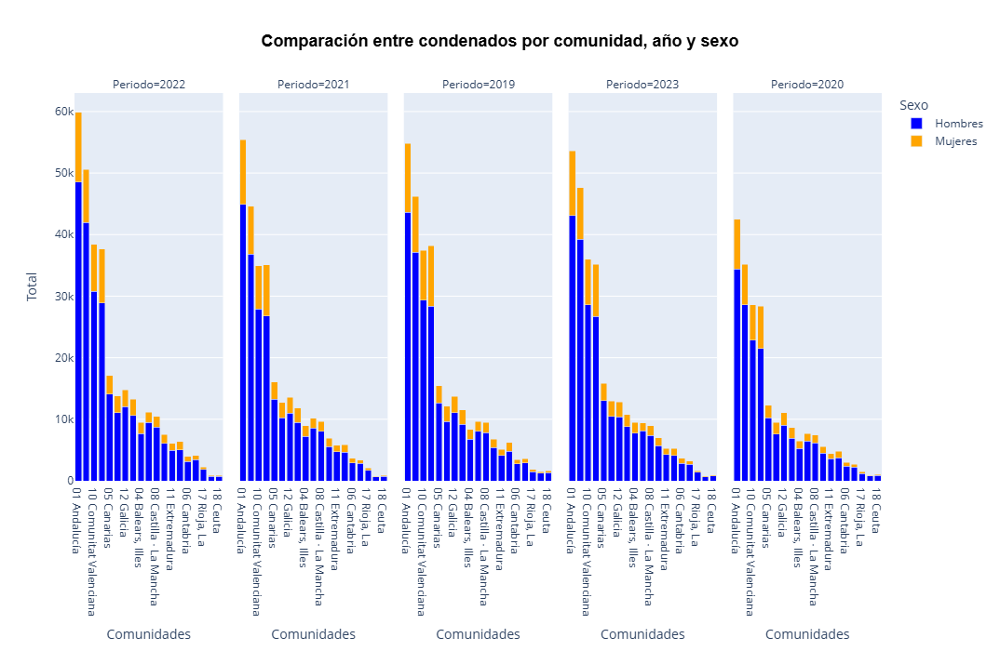

In [111]:

# Crear gráfico de barras apiladas
fig = px.bar(
    datos_filtrados_sexo,
    x='Comunidades y ciudades autónomas',
    y='Total',
    color='Sexo',
    barmode='stack',
    facet_col='Periodo',  # Dividir por periodo (años)
    title='Distribución de Totales por Sexo y Comunidades Autónomas',
    labels={'Total': 'Total', 'Comunidades y ciudades autónomas': 'Comunidades'},
    height=700,
    width=1100,
    color_discrete_map={
        'Hombres': 'blue', 
        'Mujeres': 'orange'
 }
)

fig.update_layout(
    title=dict(
        text='Comparación entre condenados por comunidad, año y sexo ',
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
    xaxis={'categoryorder': 'total descending'})  # Ordenar por total descendente
grafico.write_html("grafica9.html")
fig.show()



#### En esta representación podemos hacer una comparativa general entre el total de condenados de cada una de las comunidades en cada año, distinguiendo además su sexo. El año en el que más condenados hubo fue 2022 ,seguido de 2021, 2019 ,2023 y por último 2020 ,como era esperable.En todos los casos, la mayor suma de condenados pertenece a los hombres.

## Distribución total por comunidad autónoma y sexo 

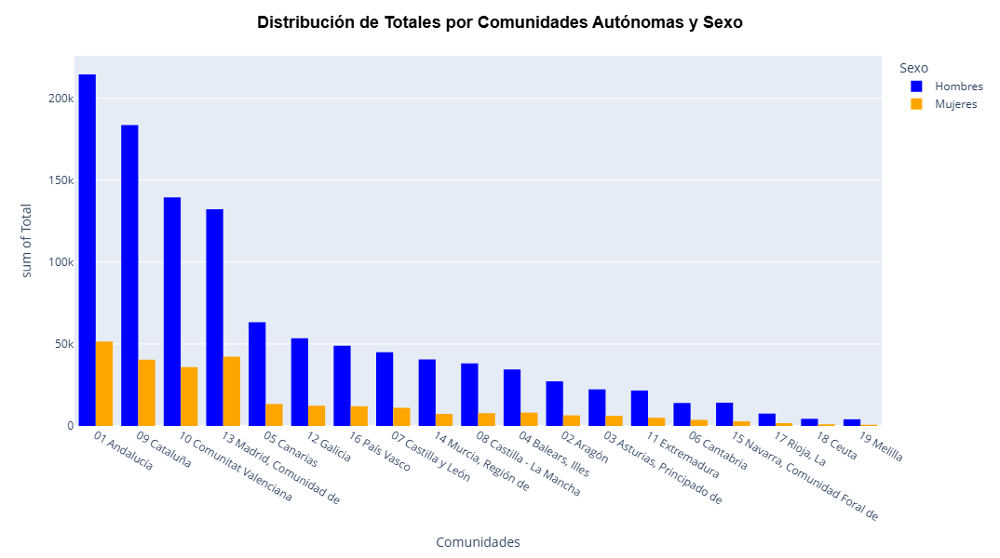

In [114]:

# Crear un gráfico de barras agrupadas
fig = px.histogram(
    datos_filtrados_sexo,
    x='Comunidades y ciudades autónomas',
    y='Total',
    color='Sexo',
    barmode='group',  # Agrupado en lugar de apilado
    labels={'Total': 'Total', 'Comunidades y ciudades autónomas': 'Comunidades'},
    height=600,
    width=1200,
    color_discrete_map={
        'Hombres': 'blue', 
        'Mujeres': 'orange'
 }
)

fig.update_layout(
     title=dict(
        text='Distribución de Totales por Comunidades Autónomas y Sexo ',
       font=dict(size=18, family="Arial", color="black", weight="bold"),  
        x=0.5,  # Centrar el título
    ),
    xaxis={'categoryorder': 'total descending'},  # Ordenar comunidades por total
    legend_title_text='Sexo'  # Etiqueta para la leyenda
)
grafico.write_html("grafica10.html")
fig.show()




## Representación geográfica 
#### En esta sección representaremos geográficamente nuestros datos y haremos un análisis de los mismos, añadiendo posteriormente la renta de cada comunidad autónoma.

#### https://www.w3schools.com/python/ref_string_split.asp
#### https://docs.kanaries.net/es/topics/Python/dataframe-drop-column

In [49]:
#cargamos nuestros datos y el shp de las comunidades
datos = pd.read_csv('condenados_final.csv', encoding='latin-1', sep=";")
shp = gpd.read_file(r'Comunidades_Autonomas_ETRS89_30N.shp')

#limpiamos el shp para dar resultados mas claros 
shp = shp.drop(columns=['Texto_Alt'])
shp = shp.rename(columns={'Codigo': 'Código'})
shp.head()

,Código,Texto,geometry
0,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480..."
1,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4..."
2,03,Principado de Asturias,"POLYGON ((271018.942 4838166.722, 270811.933 4..."
3,04,Islas Baleares,"MULTIPOLYGON (((885504.705 4299411.461, 885930..."
4,05,Canarias,"MULTIPOLYGON (((-978944.276 3171831.877, -9788..."


In [50]:
# separamos el codigo de cada comnunidad del nombre para unirlo posteriormente 
datos[['Código', 'Comunidad']] = datos['Comunidades y ciudades autónomas'].str.extract(r'(\d+)\s(.+)')
datos.rename(columns={'Total': 'Total Condenados'}, inplace=True)
datos = datos.drop(columns=['Comunidades y ciudades autónomas'])

datos.head()

,Sexo,Nacionalidad,Periodo,Total Condenados,Código,Comunidad
0,Total,Total,2019,54848,01,Andalucía
1,Total,Española,2019,46444,01,Andalucía
2,Total,Extranjera,2019,8404,01,Andalucía
3,Hombres,Total,2019,43624,01,Andalucía
4,Hombres,Española,2019,36775,01,Andalucía


In [51]:
#unimos el archivo shp con nuestros datos de condenados por Código de la Comunidad

condenados_shp = gpd.GeoDataFrame(
    shp.merge(datos, on='Código')
)

condenados_shp

,Código,Texto,geometry,Sexo,Nacionalidad,Periodo,Total Condenados,Comunidad
0,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2019,54848,Andalucía
1,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Española,2019,46444,Andalucía
2,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Extranjera,2019,8404,Andalucía
3,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Hombres,Total,2019,43624,Andalucía
4,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Hombres,Española,2019,36775,Andalucía
...,...,...,...,...,...,...,...,...
850,19,Melilla,"POLYGON ((504314.327 3908532.152, 504621.853 3...",Hombres,Española,2023,479,Melilla
851,19,Melilla,"POLYGON ((504314.327 3908532.152, 504621.853 3...",Hombres,Extranjera,2023,176,Melilla
852,19,Melilla,"POLYGON ((504314.327 3908532.152, 504621.853 3...",Mujeres,Total,2023,124,Melilla
853,19,Melilla,"POLYGON ((504314.327 3908532.152, 504621.853 3...",Mujeres,Española,2023,93,Melilla


In [52]:
print(condenados_shp.columns)

Index(['Código', 'Texto', 'geometry', 'Sexo', 'Nacionalidad', 'Periodo',
       'Total Condenados', 'Comunidad'],
      dtype='object')


In [53]:
condenados_filtrados = condenados_shp[
    (condenados_shp['Sexo'] == 'Total') & (condenados_shp['Nacionalidad'] == 'Total')
]
condenados_filtrados.head(10)

,Código,Texto,geometry,Sexo,Nacionalidad,Periodo,Total Condenados,Comunidad
0,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2019,54848,Andalucía
9,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2020,42464,Andalucía
18,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2021,55397,Andalucía
27,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2022,59859,Andalucía
36,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2023,53568,Andalucía
45,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2019,6742,Aragón
54,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2020,5521,Aragón
63,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2021,6898,Aragón
72,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2022,7549,Aragón
81,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2023,7012,Aragón


In [54]:
total_por_comunidad = condenados_filtrados.groupby('Comunidad')['Total Condenados'].sum().reset_index()
total_por_comunidad = total_por_comunidad.rename(columns={'Total Condenados': 'Total Condenados Todos Años'})

# Unir los totales a la tabla filtrada original
condenados_filtrados = condenados_filtrados.merge(total_por_comunidad, on='Comunidad')

# Mostrar la tabla resultante
condenados_filtrados.head(10)

,Código,Texto,geometry,Sexo,Nacionalidad,Periodo,Total Condenados,Comunidad,Total Condenados Todos Años
0,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2019,54848,Andalucía,266136
1,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2020,42464,Andalucía,266136
2,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2021,55397,Andalucía,266136
3,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2022,59859,Andalucía,266136
4,01,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,2023,53568,Andalucía,266136
5,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2019,6742,Aragón,33722
6,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2020,5521,Aragón,33722
7,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2021,6898,Aragón,33722
8,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2022,7549,Aragón,33722
9,02,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,2023,7012,Aragón,33722


### Creamos un mapa interactivo con nuestro geodataframe 

In [55]:
condenados_filtrados.explore('Texto')

#### De esta manera podemos ubicar las comunidades españolas y ver los datos más relevantes de cada una de ellas como el número total de condenados.

## ¿Cómo se distribuyen los casos de condenados en la Península?

#### Representamos los casos totales de condenados en España, sin tener en cuenta el sexo ni la nacionalidad en los cinco años estudiados .

In [56]:

mapa =condenados_filtrados.explore(
    column='Total Condenados Todos Años',  
    tiles='CartoDB positron',  
    cmap='Reds',  
    legend=True, 
    tooltip=['Total Condenados'],  
    popup=True,  
    name="Total de Condenados Todos Años",
    vmin=condenados_shp['Total Condenados'].min(),  
    vmax=condenados_shp['Total Condenados'].max(),  
)
mapa

#### De esta manera podemos ubicar las comunidades donde más casos hay (Andalucía) y donde menos (La Rioja)

## Añadimos el shp de la RENTA en cada una de las comunidades en los cinco años estudiados 

In [57]:
renta=pd.read_csv('renta.csv', encoding='latin-1', sep=";")

renta[['Código', 'Comunidad']] = renta['Comunidades y Ciudades Autónomas'].str.extract(r'(\d+)\s(.+)')
renta.rename(columns={'Renta anual neta media por hogar': 'Renta'}, inplace=True)
renta.rename(columns={'Total': 'Renta_total'}, inplace=True)
renta=renta.drop(columns=['Comunidades y Ciudades Autónomas'])
renta.head(30)


,Renta,Periodo,Renta_total,Código,Comunidad
0,Renta neta media por hogar,2023,34821,NaN,NaN
1,Renta neta media por hogar,2022,32216,NaN,NaN
2,Renta neta media por hogar,2021,30552,NaN,NaN
3,Renta neta media por hogar,2020,30690,NaN,NaN
4,Renta neta media por hogar,2019,29132,NaN,NaN
5,Renta neta media por hogar,2023,29916,01,Andalucía
6,Renta neta media por hogar,2022,27446,01,Andalucía
7,Renta neta media por hogar,2021,25601,01,Andalucía
8,Renta neta media por hogar,2020,25909,01,Andalucía
9,Renta neta media por hogar,2019,23826,01,Andalucía


In [36]:
#creamos un geodataframe y unimos el csv de la renta de cada comunidad con nuestros datos iniciales 
gdf = gpd.GeoDataFrame(pd.merge(renta,condenados_filtrados, on=['Código', 'Periodo','Comunidad'], how='inner'))
gdf.dtypes
gdf.head(10)

,Renta,Periodo,Renta_total,Código,Comunidad,Texto,geometry,Sexo,Nacionalidad,Total Condenados,Total Condenados Todos Años
0,Renta neta media por hogar,2023,29916,01,Andalucía,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,53568,266136
1,Renta neta media por hogar,2022,27446,01,Andalucía,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,59859,266136
2,Renta neta media por hogar,2021,25601,01,Andalucía,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,55397,266136
3,Renta neta media por hogar,2020,25909,01,Andalucía,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,42464,266136
4,Renta neta media por hogar,2019,23826,01,Andalucía,Andalucía,"MULTIPOLYGON (((280486.752 3993822.444, 280480...",Total,Total,54848,266136
5,Renta neta media por hogar,2023,35026,02,Aragón,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,7012,33722
6,Renta neta media por hogar,2022,33181,02,Aragón,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,7549,33722
7,Renta neta media por hogar,2021,32067,02,Aragón,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,6898,33722
8,Renta neta media por hogar,2020,31529,02,Aragón,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,5521,33722
9,Renta neta media por hogar,2019,29672,02,Aragón,Aragón,"POLYGON ((683851.102 4754656.795, 684117.092 4...",Total,Total,6742,33722


In [37]:
gdf.dtypes
gdf['Renta_total'].describe()

count       95.000000
mean     31507.947368
std       4937.814435
min      21611.000000
25%      27780.000000
50%      30509.000000
75%      35308.500000
max      42926.000000
Name: Renta_total, dtype: float64

In [58]:
#tenemos en cuenta solamente el territorio peninsular
peninsula = gdf[gdf['Texto'].str.contains('Baleares|Ceuta|Melilla|Canarias')]
peninsula
gdf= gdf[gdf['Código'].str.contains('04|18|19|05')==False]
gdf.tail()

,Renta,Periodo,Renta_total,Código,Comunidad,Texto,geometry,Sexo,Nacionalidad,Total Condenados,Total Condenados Todos Años
80,Renta neta media por hogar,2023,33245,17,"Rioja, La",La Rioja,"POLYGON ((500227.096 4721076.266, 500824.099 4...",Total,Total,1640,9274
81,Renta neta media por hogar,2022,31874,17,"Rioja, La",La Rioja,"POLYGON ((500227.096 4721076.266, 500824.099 4...",Total,Total,2266,9274
82,Renta neta media por hogar,2021,30598,17,"Rioja, La",La Rioja,"POLYGON ((500227.096 4721076.266, 500824.099 4...",Total,Total,2076,9274
83,Renta neta media por hogar,2020,32096,17,"Rioja, La",La Rioja,"POLYGON ((500227.096 4721076.266, 500824.099 4...",Total,Total,1446,9274
84,Renta neta media por hogar,2019,30162,17,"Rioja, La",La Rioja,"POLYGON ((500227.096 4721076.266, 500824.099 4...",Total,Total,1846,9274


## Análisis con la renta de cada comunidad 

### Clasificación por rupturas naturales Jenks

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

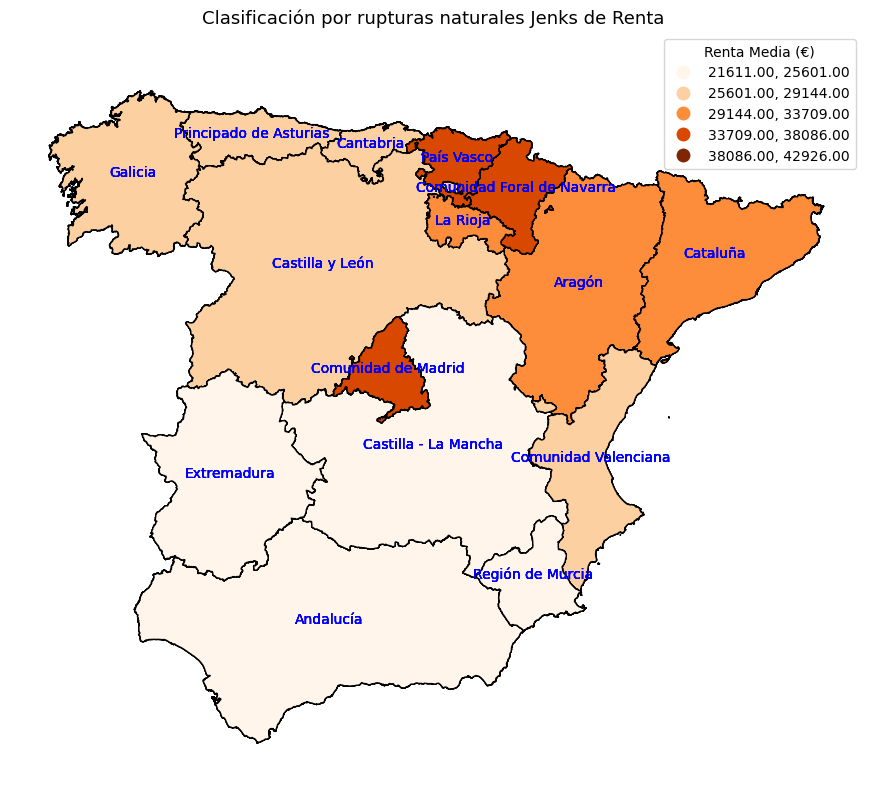

In [39]:
#RENTA
f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por rupturas naturales Jenks de Renta ', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='Blue'), axis=1);
gdf.plot(ax=ax, column='Renta_total', scheme='fisher_jenks',k=5, cmap='Oranges', edgecolor='black',legend=True,legend_kwds={'title':"Renta Media (€)", 'loc': 'upper right'}) 

plt.axis('equal')
plt.axis('off')

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

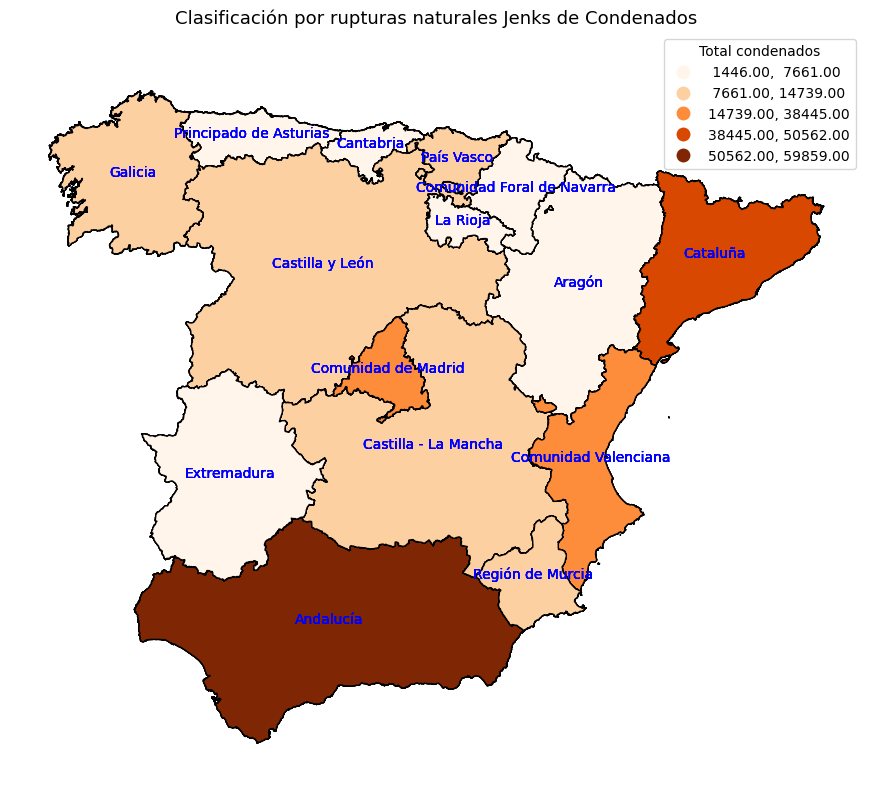

In [61]:
#CONDENADOS
f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por rupturas naturales Jenks de Condenados', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='Blue'), axis=1);
gdf.plot(ax=ax, column='Total Condenados', scheme='fisher_jenks',k=5, cmap='Oranges', edgecolor='black',legend=True,legend_kwds={'title':"Total condenados", 'loc': 'upper right'}) 

plt.axis('equal')
plt.axis('off')


#### La representación por rupturas naturales de Jenks es un método que clasfica los datos de manera que se minimice la varianza dentro de los datos de cada una de las clases maximizándola entre las otras clases para identificar grupos y patrones en los datos. En este caso observamos que las comunidades con mayor renta se localizan en el norte de la península concretamente  Madrid, Navarra y País Vasco. Las que menos renta tinen se ubican en el sur como Andalucía, Murcia y Castilla la Mancha. Visualizando el mapa de condenados por el mismo metodo observamos que Andalucía presenta el mayor número. Por esa parte, y con este método de representación podríamos decir que hay una relación entre la renta y número de condenas, aunque no podríamos confirmalo puesto que las demás comunidades no coincide una renta baja con un total alto de condenados .

### Clasificación por cuantiles 

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

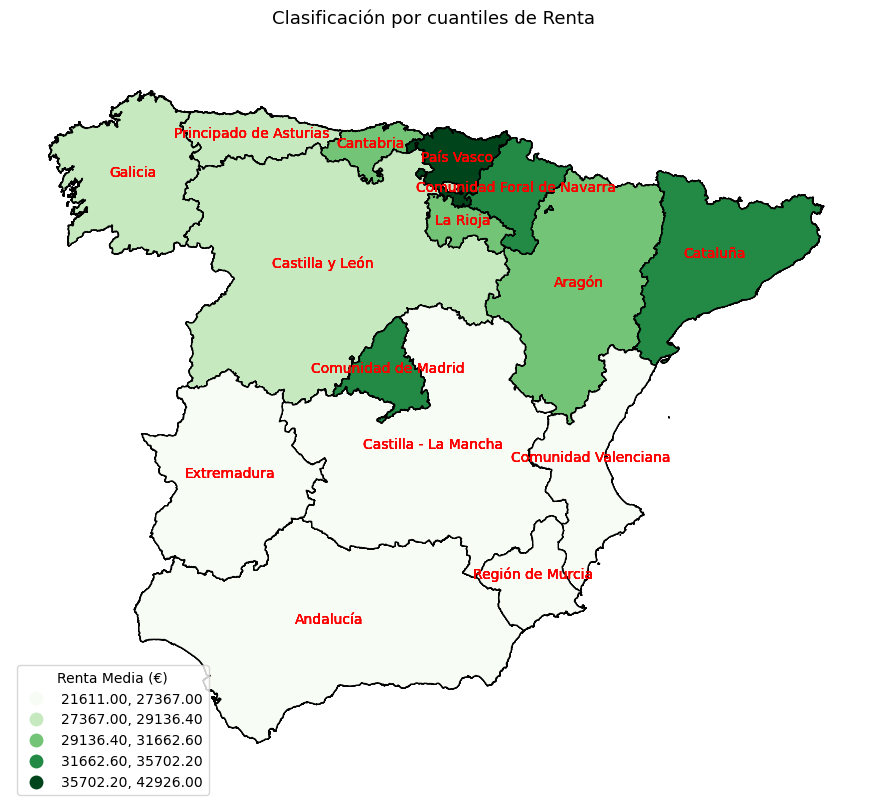

In [62]:
#RENTA
f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por cuantiles de Renta ', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='red'), axis=1);
gdf.plot(ax=ax, column='Renta_total', scheme='quantiles', k=5, cmap='Greens', edgecolor='black',legend=True,legend_kwds={'title':"Renta Media (€)", 'loc': 'lower left'}) 

plt.axis('equal')
plt.axis('off')

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

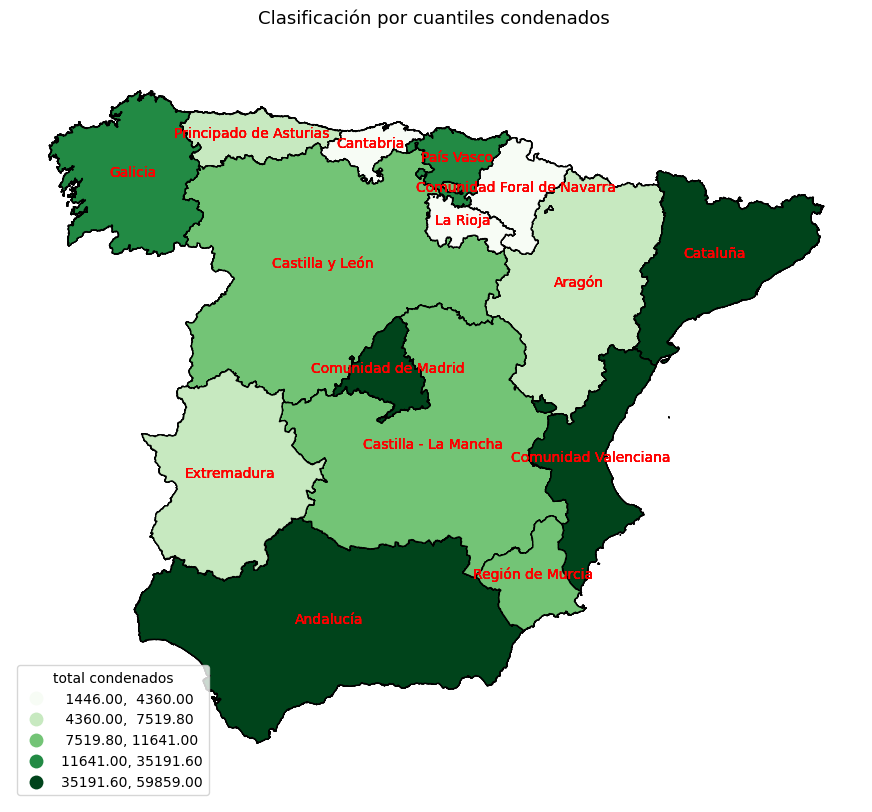

In [64]:
#CONDENADOS
f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por cuantiles condenados ', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='red'), axis=1);
gdf.plot(ax=ax, column='Total Condenados', scheme='quantiles', k=5, cmap='Greens', edgecolor='black',legend=True,legend_kwds={'title':"total condenados", 'loc': 'lower left'}) 

plt.axis('equal')
plt.axis('off')

#### El método de clasificación por cuantiles es una técnica en las que se dividen los datos en clases con el mismo número de observaciones, en este caso dividimos el total en cuatro partes iguales. De la misma manera observamos como las comunidades con mayor renta se encuentran en la parte norte, en muchas de las comunidades coincide con bajos casos de condenados como en Navarra y Cantabria.


### Desviación estandar

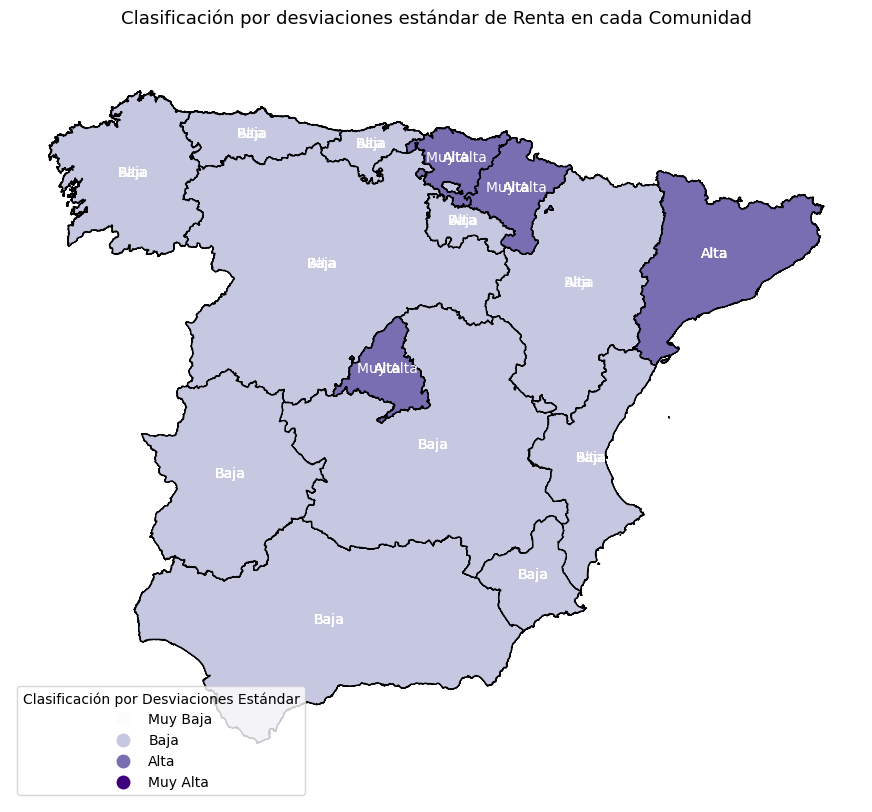

In [66]:
#RENTA
# media y la desviación estándar
media = gdf['Renta_total'].mean()
desviacion_estandar = gdf['Renta_total'].std()

#  límites de clasificación 
limite_inferior = media - 2 * desviacion_estandar
limite_superior = media + 2 * desviacion_estandar

# Clasificar los datos en función de las desviaciones estándar
gdf['clasificacion'] = pd.cut(gdf['Renta_total'], bins=[-float('inf'), limite_inferior, media, limite_superior, float('inf')], labels=['Muy Baja', 'Baja', 'Alta', 'Muy Alta'])

# Crear el mapa
f, ax = plt.subplots(1, figsize=(11, 10))
ax.set_title('Clasificación por desviaciones estándar de Renta en cada Comunidad', size=13)
gdf.apply(lambda x: ax.annotate(text=x['clasificacion'], xy=x.geometry.centroid.coords[0], ha='center', color='white'), axis=1)
gdf.plot(ax=ax, column='clasificacion', cmap='Purples', edgecolor='black', legend=True, legend_kwds={'title': "Clasificación por Desviaciones Estándar", 'loc': 'lower left'})

plt.axis('equal')
plt.axis('off')
plt.show()

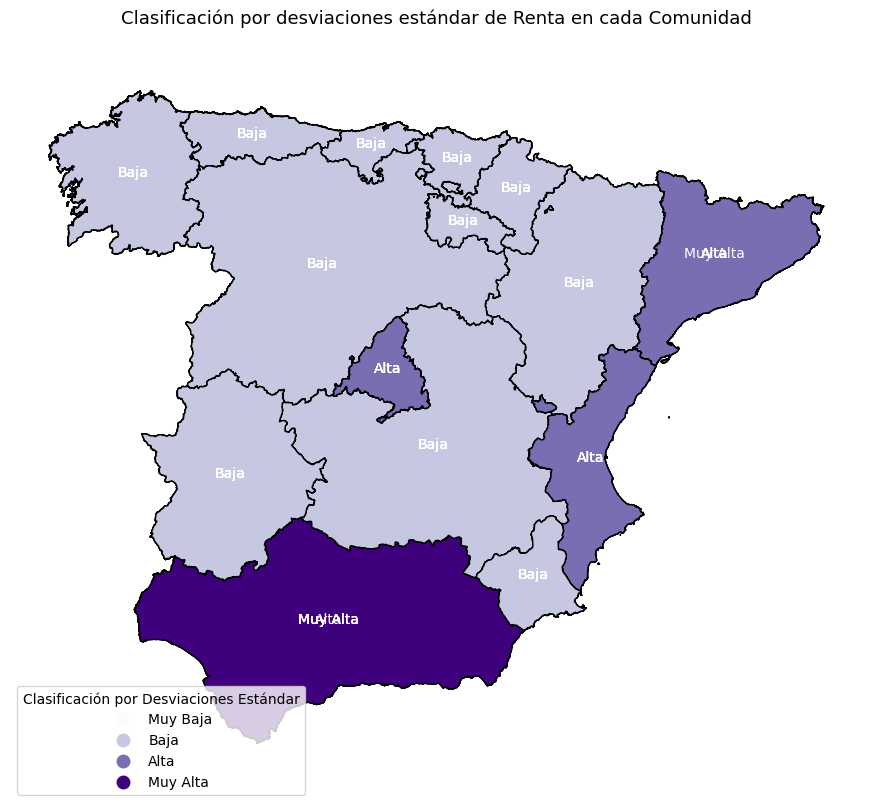

In [70]:
#CONDENADOS
# media y la desviación estándar
media = gdf['Total Condenados'].mean()
desviacion_estandar = gdf['Total Condenados'].std()

# límites de clasificación en términos de desviaciones estándar
limite_inferior = media - 2 * desviacion_estandar
limite_superior = media + 2 * desviacion_estandar

# Clasificar los datos en función de las desviaciones estándar
gdf['clasificacion'] = pd.cut(gdf['Total Condenados'], bins=[-float('inf'), limite_inferior, media, limite_superior, float('inf')], labels=['Muy Baja', 'Baja', 'Alta', 'Muy Alta'])

# Crear el mapa
f, ax = plt.subplots(1, figsize=(11, 10))
ax.set_title('Clasificación por desviaciones estándar de Renta en cada Comunidad', size=13)
gdf.apply(lambda x: ax.annotate(text=x['clasificacion'], xy=x.geometry.centroid.coords[0], ha='center', color='white'), axis=1)
gdf.plot(ax=ax, column='clasificacion', cmap='Purples', edgecolor='black', legend=True, legend_kwds={'title': "Clasificación por Desviaciones Estándar", 'loc': 'lower left'})

plt.axis('equal')
plt.axis('off')
plt.show()

#### El método de la desviación estándar es otra de las técnicas de clasificaión en la que se utiliza la media y la desviación estandar para crear intervalos de clase. Con este método podemos ver como los valores se desvían de la media .De esta manera observamos valores altos analizando la renta en comunidades como Madrid, País Vasco , Navarra y Cataluña y valores muy altos en condenados en Andalucia .

### BoxPlot Gráfico de cajas y bigotes

#### https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.pivot.html
#### https://seaborn.pydata.org/generated/seaborn.boxplot.html
#### corrección errores chatgpt

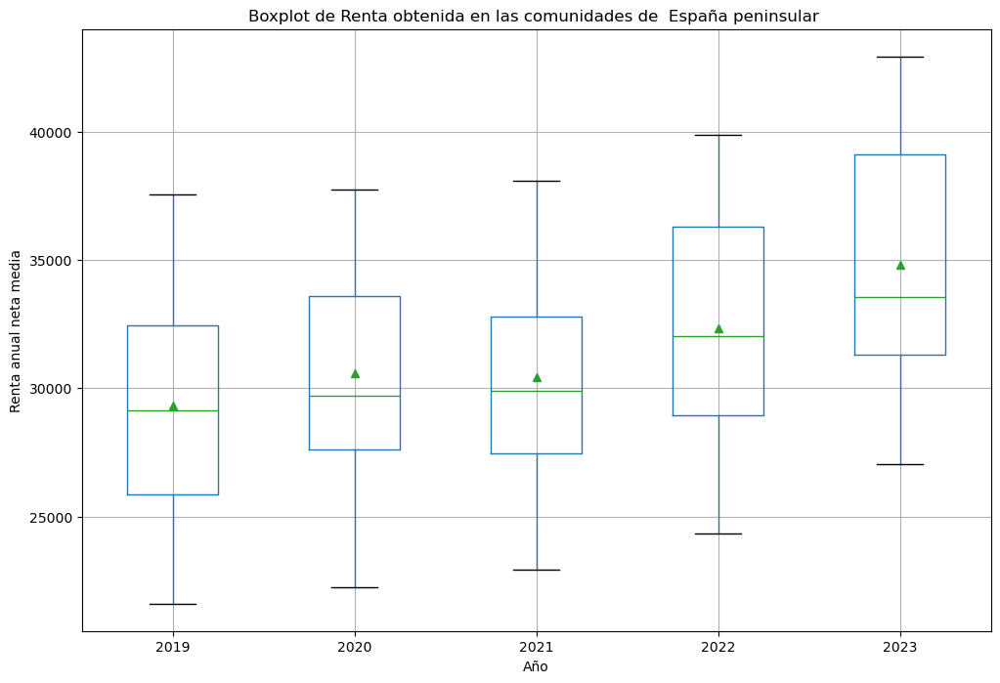

In [72]:
# Cada año es una columna
renta_pivot = renta.pivot(index="Comunidad", columns="Periodo", values="Renta_total")

# Crear el boxplot para las columnas reorganizadas
renta_pivot.boxplot(showmeans=True, showbox=True, figsize=(12, 8))

plt.title('Boxplot de Renta obtenida en las comunidades de  España peninsular ')
plt.ylabel('Renta anual neta media')
plt.xlabel('Año')
plt.show()

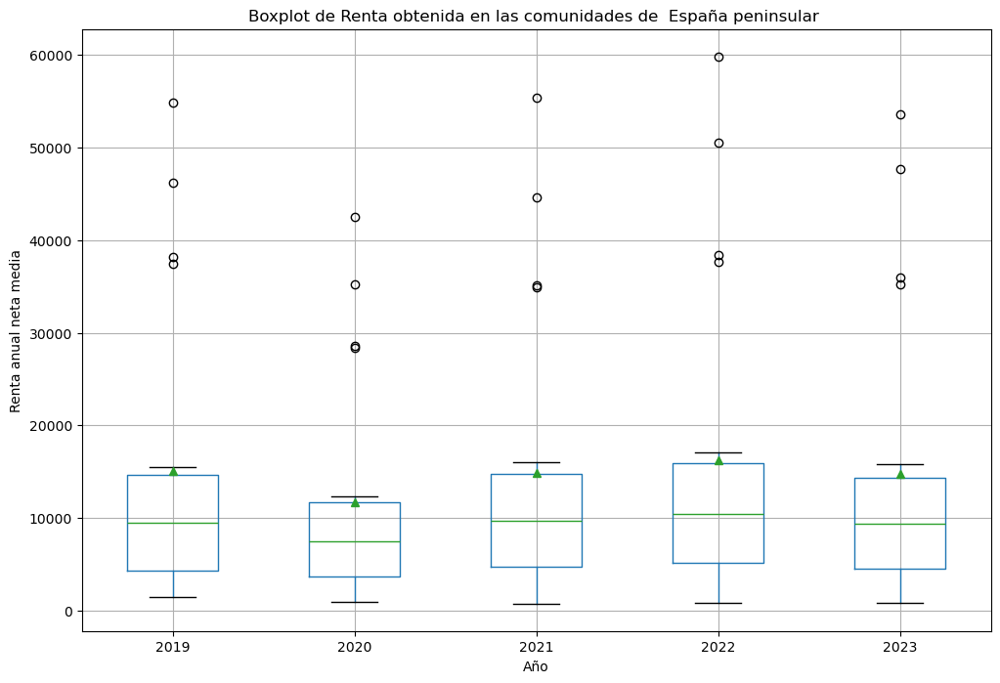

In [73]:
# Cada año es una columna
cond = condenados_filtrados.pivot(index="Comunidad", columns="Periodo", values="Total Condenados")

# Crear el boxplot para las columnas reorganizadas
cond.boxplot(showmeans=True, showbox=True, figsize=(12, 8))

# Configuración del título y ejes
plt.title('Boxplot de Renta obtenida en las comunidades de  España peninsular ')
plt.ylabel('Renta anual neta media')
plt.xlabel('Año')
plt.show()

#### El boxplot nos permite ver la distribución de nuetros datos.
#### El primer gráfico de la renta no muestra ningún outlier relevante. Entre los años 2019 al 2021 los valores medios se concentran en torno a 30000 y la variabilidad ,la media supera ligeramente a la mediana en todos los años 
#### En el segundo gráfico se muestra una variabilidad mucho mas pequeñña ,en todos los casos la media estadística supera a la mediana con diferencia y nos encontramos algunos outliers que pueden ser las comunidades que presentan un total de condenados más elevado como Andalucía.

## ¿Cuál es la comunidad Autónoma con mayor renta ?

#### https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.plot.html

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

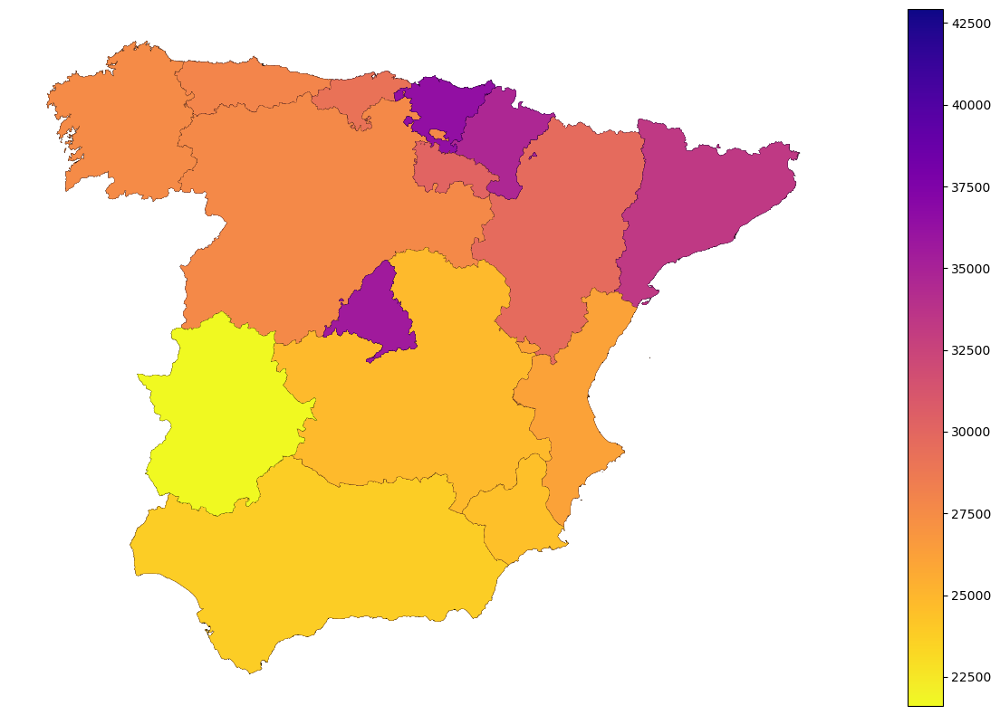

In [74]:
gdf.plot("Renta_total", cmap="plasma_r", linewidth=0.1, edgecolor='black', figsize=(20,10),legend='true')
plt.axis('off')

## ¿Cuál es la Comunidad Autónoma con mayor número de condenados?

(-65896.3598016671, 1073717.087833155, 3943510.358363095, 4902845.846994656)

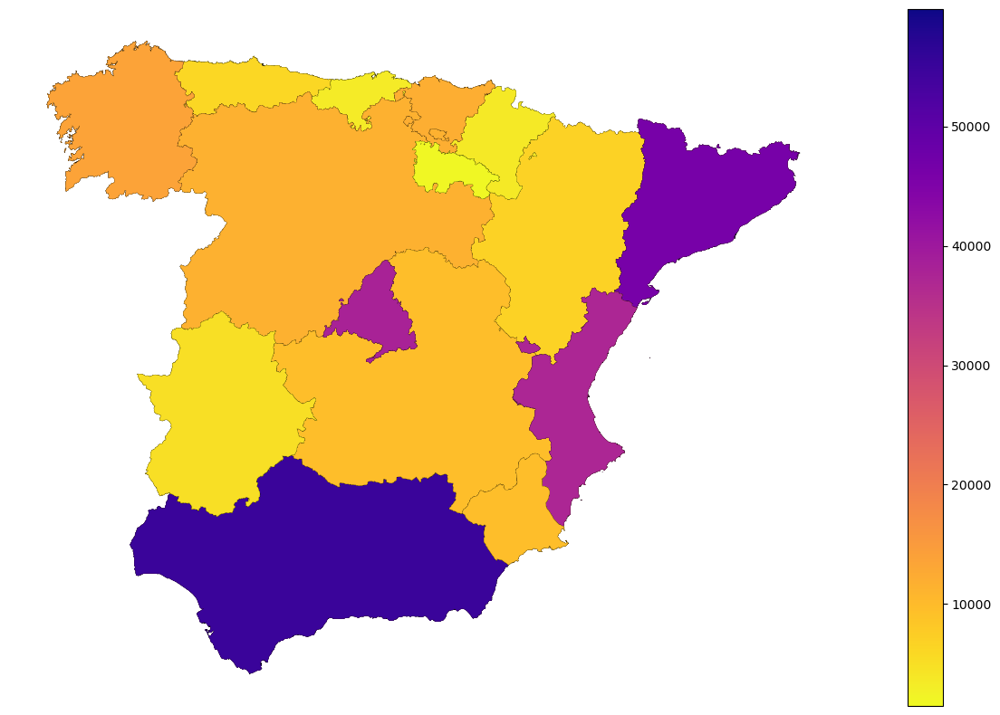

In [76]:
gdf.plot("Total Condenados", cmap="plasma_r", linewidth=0.1, edgecolor='black', figsize=(20,10),legend='true')
plt.axis('off')

#### Las comunidades con mayor renta según vemos en la represetnación son Madrid y País Vasco, seguidas de Navarra y Cataluña. Mientras que las comunidaes con mayor total de condenados son Andalucía y Cataluña, seguidas de Madrid y Valencia.

## Histograma

#### Código extraido de la documantación : https://juncotic.com/histogramas-con-matplotlib/ y adaptado con chatgpt

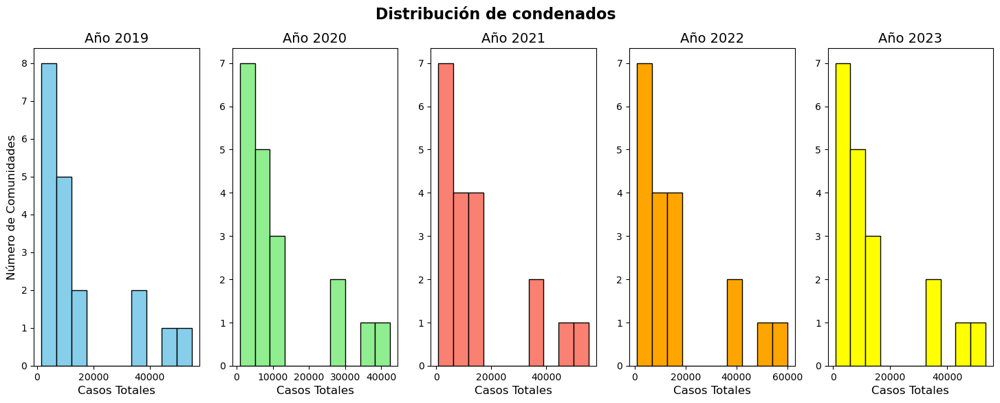

In [77]:

fig, histogramas = plt.subplots(1, 5, figsize=(18, 6))
fig.suptitle('Distribución de condenados ', fontsize=16, weight='bold')

condenas_2019 = condenados_filtrados[condenados_filtrados['Periodo'] == 2019]
condenas_2020 = condenados_filtrados[condenados_filtrados['Periodo'] == 2020]
condenas_2021 = condenados_filtrados[condenados_filtrados['Periodo'] == 2021]
condenas_2022 = condenados_filtrados[condenados_filtrados['Periodo'] == 2022]
condenas_2023 = condenados_filtrados[condenados_filtrados['Periodo'] == 2023]

histogramas[0].hist(condenas_2019['Total Condenados'], bins=10, color='skyblue', edgecolor='black')
histogramas[0].set_title('Año 2019', fontsize=14)
histogramas[0].set_xlabel('Casos Totales', fontsize=12)
histogramas[0].set_ylabel('Número de Comunidades', fontsize=12)

histogramas[1].hist(condenas_2020['Total Condenados'], bins=10, color='lightgreen', edgecolor='black')
histogramas[1].set_title('Año 2020', fontsize=14)
histogramas[1].set_xlabel('Casos Totales', fontsize=12)

histogramas[2].hist(condenas_2021['Total Condenados'], bins=10, color='salmon', edgecolor='black')
histogramas[2].set_title('Año 2021', fontsize=14)
histogramas[2].set_xlabel('Casos Totales', fontsize=12)

histogramas[3].hist(condenas_2022['Total Condenados'], bins=10, color='orange', edgecolor='black')
histogramas[3].set_title('Año 2022', fontsize=14)
histogramas[3].set_xlabel('Casos Totales', fontsize=12)

histogramas[4].hist(condenas_2023['Total Condenados'], bins=10, color='yellow', edgecolor='black')
histogramas[4].set_title('Año 2023', fontsize=14)
histogramas[4].set_xlabel('Casos Totales', fontsize=12)

plt.show()




#### Con el histograma vemos la distribucion de nuestro conjunto de datos , observamos que es una distribucion asimetrica y por lo tanto  no siguen una distribución normal. Están sesgados a la derecha, encontramos más comunidaes con menos de 20000 casos totales mientras que pocas superar los 40000 casos . 

## Qq-Plot

#### Codigo : https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.probplot.html y correccion de errores con chatgpt

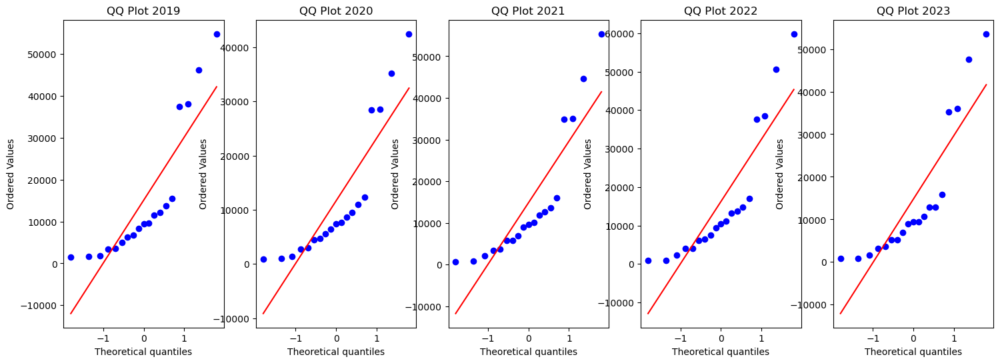

In [78]:

grafica20, ejes = plt.subplots(1, 5, figsize=(18, 6))


stats.probplot(condenas_2019['Total Condenados'], dist="norm", plot=ejes[0])
ejes[0].set_title('QQ Plot 2019')

stats.probplot(condenas_2020['Total Condenados'], dist="norm", plot=ejes[1])
ejes[1].set_title('QQ Plot 2020')

stats.probplot(condenas_2021['Total Condenados'], dist="norm", plot=ejes[2])
ejes[2].set_title('QQ Plot 2021')

stats.probplot(condenas_2022['Total Condenados'], dist="norm", plot=ejes[3])
ejes[3].set_title('QQ Plot 2022')


stats.probplot(condenas_2023['Total Condenados'], dist="norm", plot=ejes[4])
ejes[4].set_title('QQ Plot 2023')

plt.show()

#### Analizando las representaciones qq-plot observamos que nuestro conjunto de datos no sigue una distribución normal. Los puntos se separan de la línea roja (distribución normal). La curvatura en el centro del gráfico hacia abajo nos dice que los datos tienen una distribucion sesgada hacia la derecha. Los puntos alejados de la línea diagonal nos sugiere la presencia de valores extremos o outliers.

## Índice autocorrelación  de Moran (año 2023)

#### https://pysal.org/libpysal/generated/libpysal.weights.Queen.html

In [79]:
condenados_2023=condenados_filtrados[condenados_filtrados['Periodo']==2023]

w_queen = Queen.from_dataframe(condenados_2023) 
w_queen.n

C:\Users\Ana\miniconda3\envs\sos\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning:

The weights matrix is not fully connected: 
 There are 5 disconnected components.
 There are 4 islands with ids: 3, 4, 17, 18.



19

In [80]:
w_queen.neighbors[0]


[10, 13, 7]

In [81]:
mi = Moran(condenados_2023['Total Condenados'], w_queen, permutations=99999)
"%6.4f" % mi.I
print(mi.I)


('WARNING: ', 3, ' is an island (no neighbors)')
('WARNING: ', 4, ' is an island (no neighbors)')
('WARNING: ', 17, ' is an island (no neighbors)')
('WARNING: ', 18, ' is an island (no neighbors)')
-0.00010677965319716976


In [82]:
mi.p_norm

0.734774878105446

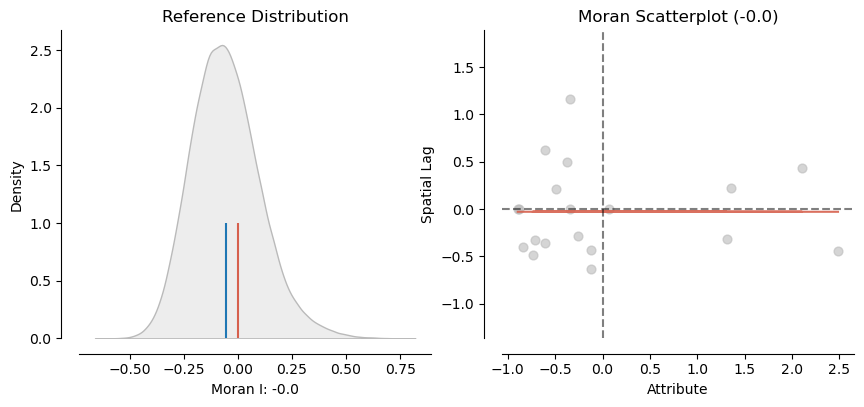

In [83]:
from splot.esda import plot_moran
plot_moran(mi, zstandard=True, figsize=(10, 4))
plt.show()

#### El índice de Moran con un valor de -0.0001 podría indicar que se trata de autocorrelación negativa, aunque aproximándose tanto al cero sugiere que no hay una autocorrelación espacial significativa por lo que la distribución de nuestros valores es aleatoria. El p-valor de un 0.73477 es mucho mayor que 0.05 lo que sugiere que no hay suficientes evidencias estadísticas para poder afirmar que hay autocorrelación espacial, reforzando la idea de que los datos son aletorios .
#### Por lo tanto no podemos rechar la hipotesis nula H0 (esta hipótesis dice que no existe correlación espacial), esto indica que los valores estan distribuidos aleatoriamente y no hay autocorrelación significativa.

## Índice de Moran global-k vecinos más próximos

#### https://pysal.org/esda/generated/esda.Moran_Local.html

In [84]:
from libpysal.weights import KNN
#5 vecinos más próximos
w5v = KNN.from_dataframe(condenados_2023, k=5) 
#Índice I global de Moran, con 5 vecinos
mi2 = Moran(condenados_2023['Total Condenados'], w5v, permutations=9999) 
"%6.4f" % mi2.I 

'-0.1508'

In [85]:
mi2.p_norm # p-valor

0.3770069948997684

#### Un valor negativo indica que las áreas que están más cerca tienen  valores más opuestos o diferentes. Este índice es cercano al cero, es una autocorrelacion negativa muy débil, por lo tanto estos valores aunque pueden ser opuestos no lo serán siempre. Un p-valor mayor de 0.05 nos indica que no se puede rechazar la hipótesis nula, esto quiere decir que la autocorrelación no es significativa, por lo que no se puede afirmar que los valores cercanos estén relacionados .


In [86]:
from esda.moran import Moran_Local

#  calcular Moran_Local y dibuja
moran_2023 = Moran_Local(condenados_2023['Total Condenados'], w_queen, permutations=9999)
moran_2023


C:\Users\Ana\miniconda3\envs\sos\Lib\site-packages\esda\moran.py:1084: RuntimeWarning:

invalid value encountered in divide



## Autocorrelación espacial Local

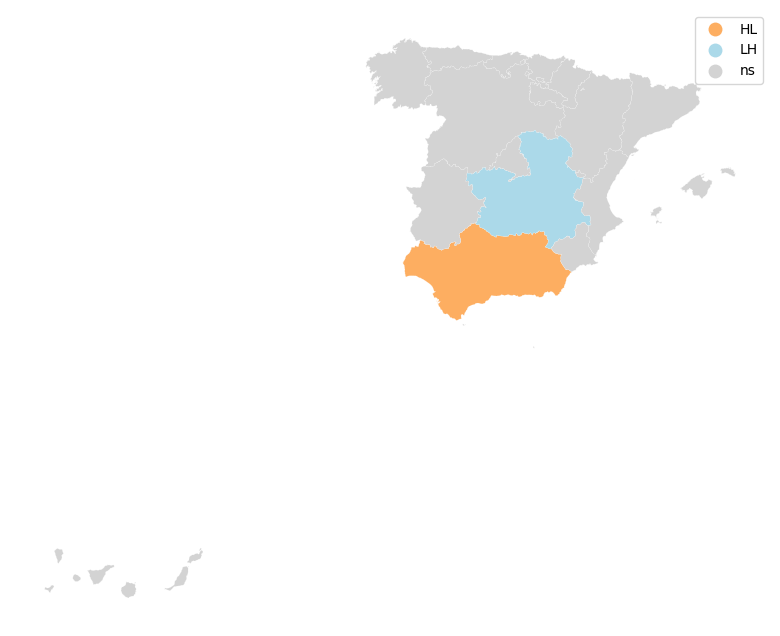

In [87]:
import geopandas as gpd
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import moran_scatterplot, lisa_cluster

# Calcular pesos espaciales ( vecinos más cercanos)
w = weights.KNN.from_dataframe(condenados_2023, k=5)

# Calcular el índice de Moran local
lisa = esda.Moran_Local(condenados_2023['Total Condenados'], w)

# Visualizar los clusters significativos
lisa_cluster(lisa, condenados_2023, p=0.05, figsize=(12, 8))
plt.show()

<Figure size 2100x1700 with 0 Axes>

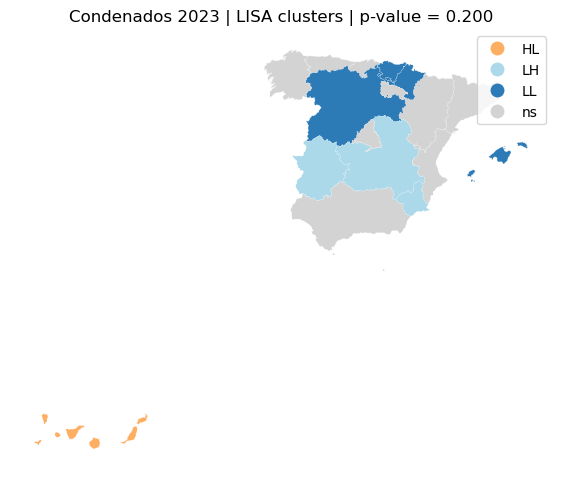

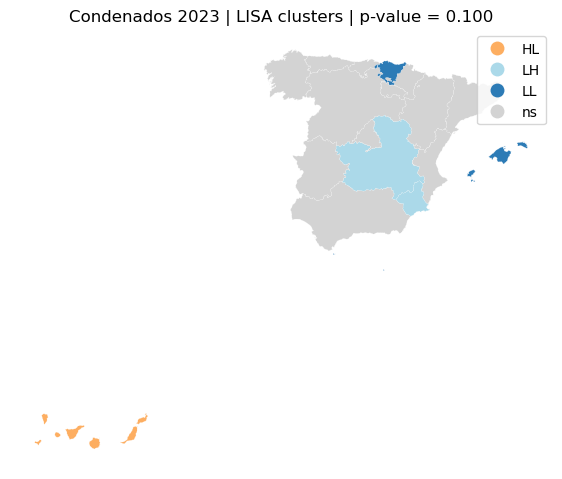

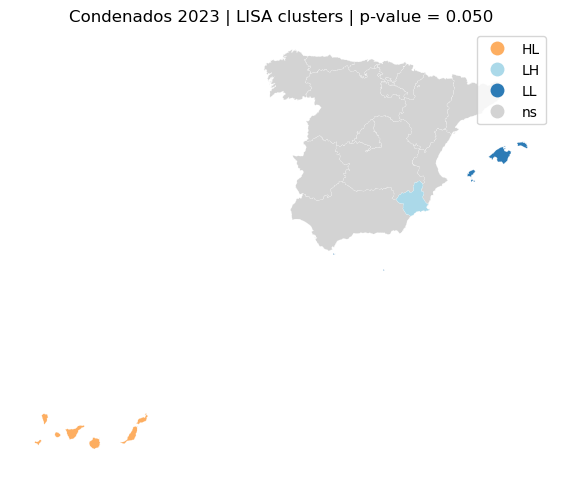

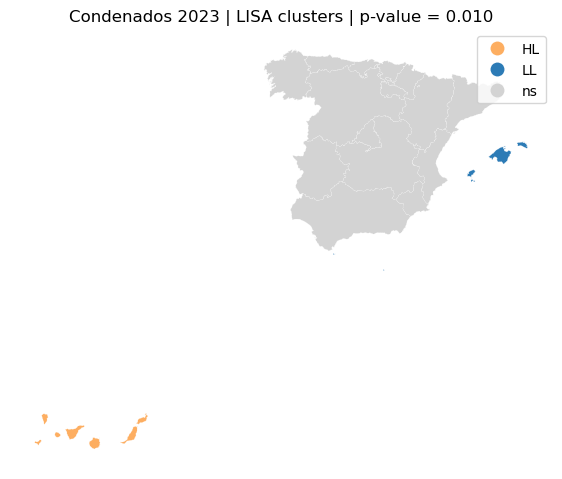

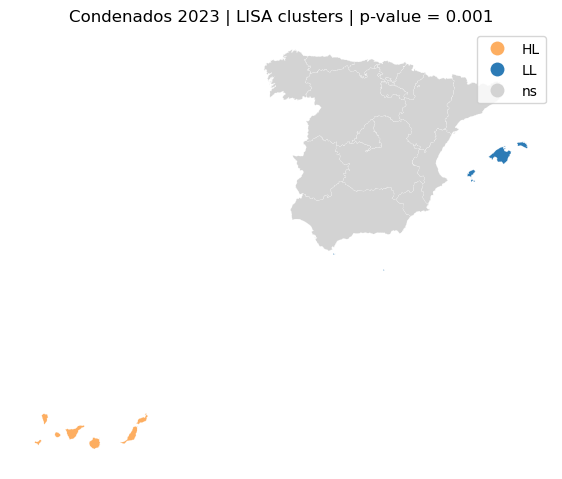

In [277]:
p_thresS = [0.2, 0.1, 0.05, 0.01, 0.001] 
f = plt.figure(figsize=(21, 17))
#cvalores LISA para cada valor p
for i, p_thres in enumerate(p_thresS):
    lisa_cluster(moran_2023, condenados_2023, p_thres, figsize = (7,7))
    plt.title('Condenados 2023 | LISA clusters | p-value = %.3f'%p_thres)
    plt.show()

#### El Índice Local de Asociación Espacial (LISA), permite la identificación de patrones locales de asociación espacial, descomponiendo el Índice Moran para evaluar la influencia de ubicaciones individuales en la estadística global. Representamos diferentes valores (0.2,0.1,0.05,0.01,0.001) de significancia estadística para analizar los patrones espaciales. Estos se comparan con los p-valores calculados . En el análisis LISA se utilizan códigos para describir los patrones espaciales locales: 

#### HH(High-High):Representan áreas con valores altos que esta rodeadas de otras áreas con valores altos. Este patrón refleja la concentración de valores altos en un cluster local.
#### HL(High-Low):Representa áreas con valores altos rodeadas por áreas de valores bajos.Los valores están asilados en relación con los valores bajos.
#### LH(High-Low):Se representan áreas con valores bajos rodeados de áreas con valores altos. Clusters locales de valores bajos 
#### LL (Low-Low):Se representan áreas con valores bajos rodeados de áreas con valores bajos .
#### NS Not Significant): Los valores no muestran patrones espaciales locales significativos.